### End-To-End Multi-Class Dog Breed Classification

This project builds a multi class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem:
Identifying the breed of a given dog image.

## 2. Data
The data we are using is from Kaggle's dog breed classification competition.

https://www.kaggle.com/c/dog-breed-classification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identifier/classification/overview/evaluation

## 4. Features
Some information about the data:
* We are dealing with images (unstructured data) so it's probably the best we use deep learning/transfer learning.
* Data contains 120 breeds of gogs (this means there are 120 different classes), therefore multiclass.
* Theer are 10,000+ images in the training set(these images have labels)
* There are 10,000+ images in the test set(these images do not have labels and need to be predicted)


### Getting our workspace ready

* Import TensorFlow 2.x 
* Import TensorFlow Hub
* Make sure we are using a GPU

In [ ]:
# Import necessary tools:

import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow Version: ", tf.__version__)
print("TensorFlow Hub Version: ", hub.__version__)

# Check if GPU is available
print("GPU", "available (YES!!)" if tf.config.list_physical_devices("GPU") else "Unavailable")

### Getting our data ready (turning images into tensors)

With all machine learning models, our data has to be in numerical format. So we turn all the images into numerical representations.

Start by accessing our data and checking out the labels.

In [ ]:
# Check the labesl of data
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

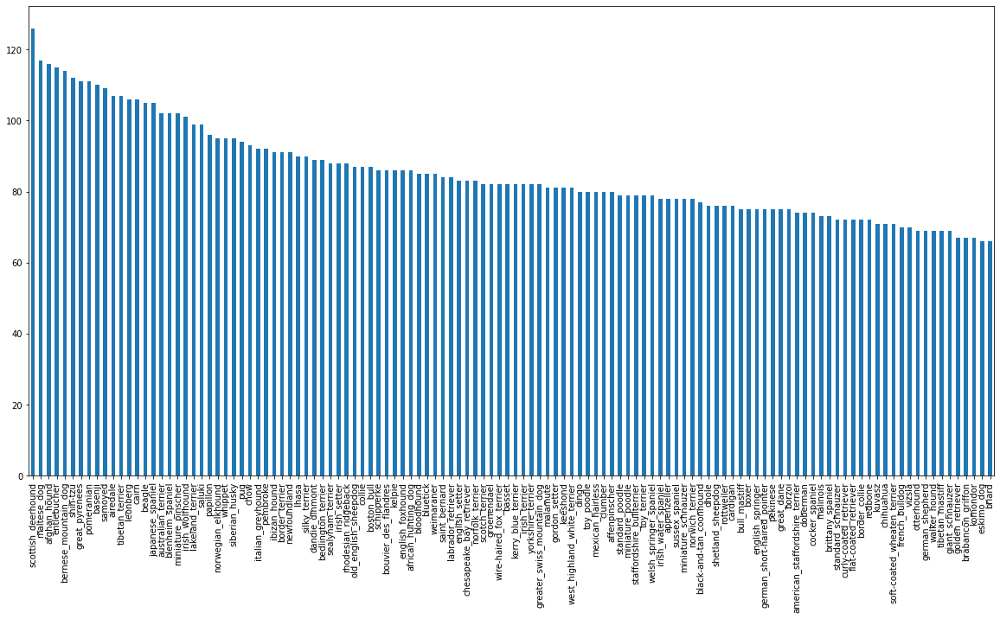

In [ ]:
# Visualise how many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
print("Each breed has dogs on an average: ", round(labels_csv["breed"].value_counts().mean(), 2))
print("Each breed has dogs on Meadian: ", labels_csv["breed"].value_counts().median())

Each breed has dogs on an average:  85.18
Each breed has dogs on Meadian:  82.0


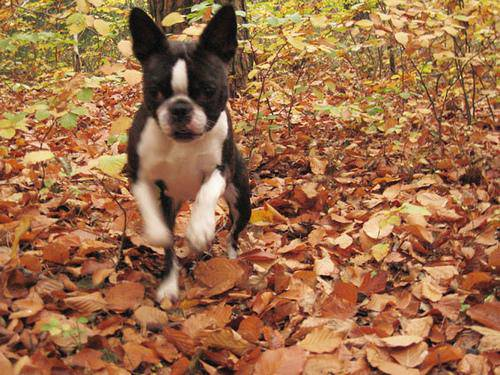

In [ ]:
# View an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Get a list of image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from their ID's
filenames = ["/content/drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

# Image(filenames[0])

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
print(len(os.listdir("drive/My Drive/Dog Vision/train/")) == len(filenames))

True


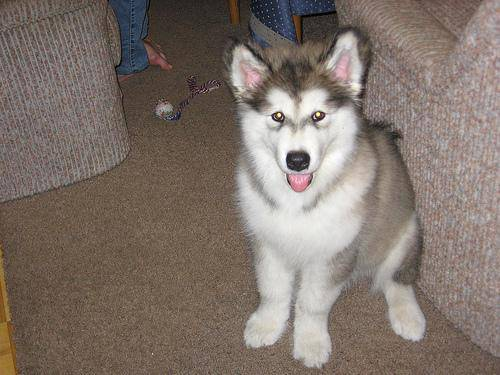

In [ ]:
# Check if tge pathnames are correct

Image(filenames[3000])

Since we have now got our training image filepaths in a list, let's prepare labels data.

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
print(len(labels)==len(filenames))

True


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
# print(unique_breeds)
print(f"There are {len(unique_breeds)} unique dog breed labels.")

There are 120 unique dog breed labels.


In [ ]:
# Turn a single label into array of boolean values
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]

boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(unique_breeds==labels[0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where sample label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
[False False False False False False False False False False False False
 False False False False False False False  True False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False]
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation dataset

Since the dataset from kaggle doesn't come with a validation set, we are going to create our own.

In [ ]:
# Set up X and y variables
X = filenames
y = boolean_labels

Initially we are going to experiment with 1000 labels and increase this count if needed.

In [ ]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split

# Split into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

### Preprocessing Images: Turning images into tensors

To preprocess our images into Tensors we are going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we begin, lets see what importing an image looks like:

In [ ]:
# Convert image into NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into tensors
tf.constant(image)[:2] # NOTE: Read the docstring

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we know, what an image looks like as a tensor, let's preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalisation: Convert the colour channel values from 0-255 to 0-1 values
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and converts it into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Normalisation: Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desire values (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

### Turning data into batches

Why turn data into batches?

Larg enumber of images do not fit into memory.
So that's why we process 32 images (batch size) at a time.

https://twitter.com/ylecun/status/989610208497360896?lang=en

In order to use TensorFlow effectively, we need data in the form of Tensor Tuples which looks like: `(Image, Label)`

In [ ]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes a image file path and an associated label.
  Processes the image and returns the required tuple.
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# For Example:
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Let's make a function to turn all data (X and y) into batches.

In [ ]:
from tensorflow.python.ops.gen_dataset_ops import batch_dataset
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image(X) and label(y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  
  # If the data is test dataset, we don't have labels for it.
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Passed only filepaths, no labels.
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is validation dataset, we don't need to shuffle it. Also it has labels.
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) # label
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into data batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating valid data batches...


In [ ]:
# Check out different attributes of our data batches
train_data.element_spec, val_data.element_spec 

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Data is now in batches, these can be hard to understand/comprehend, so we visualize the data batches here.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Set the figure
  plt.figure(figsize=(15, 15))
  # Loop through 25
  for i in range(25):
    # Create subplots
    ax = plt.subplot(5, 5, i+1)
    # Show the image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

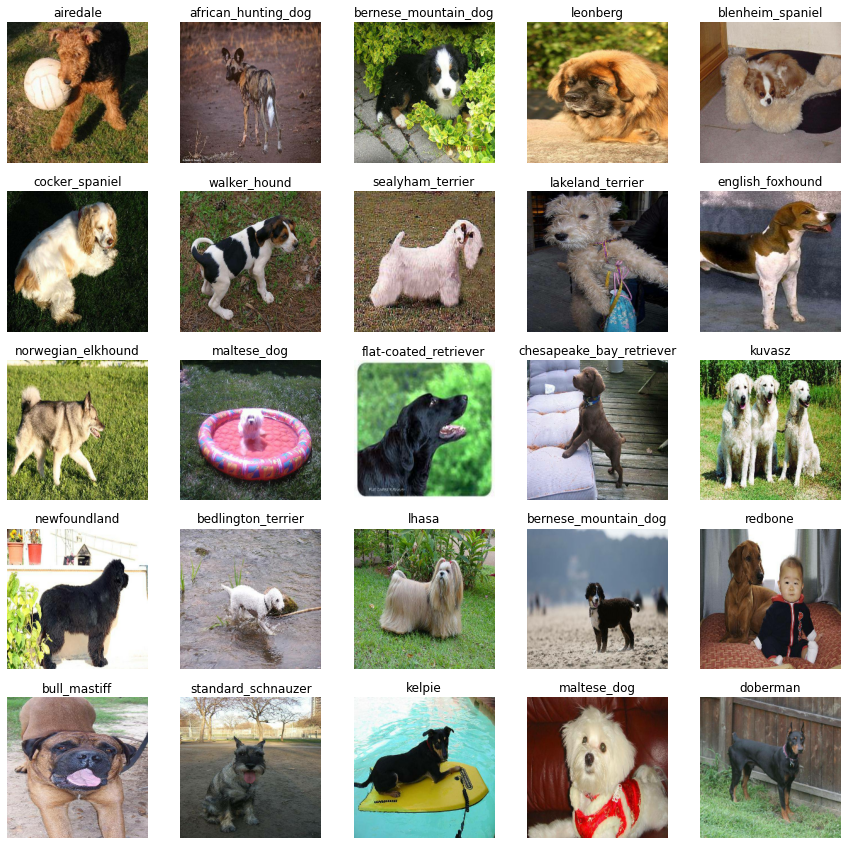

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())

show_25_images(train_images, train_labels)

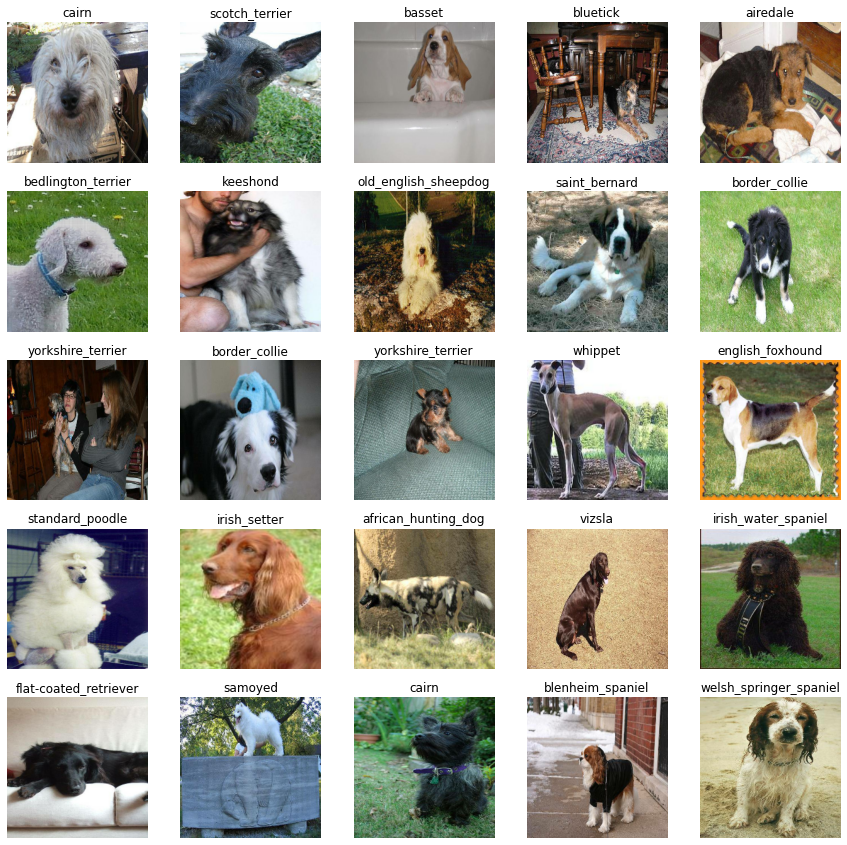

In [ ]:
# Now lets visualize validation batch data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model

Before we build a model, there a a few things we need to define:

* The input shape (image shape, in the form of Tensors) to model.
* The output shape (image label, in the form of Tensors) of model.
* The URL of the model we want to use from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup the output shape of model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we got inputs, outputs and model ready to go.

Let's put them together into a Keras Deep Learning Model!

Create a function for this:
* Takes the inputs, outputs and model we have chosen as parameters.
* Defines the layers in a Keras in sequential fashion (do this first, then that way).
* Compile the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shpae it will be getting).
* Returns the model.

All the steps are described here: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model = MODEL_URL):
  print("Building Model With: ", MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1: Input Layer
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2: Output Layer
  ]) # NOTE: For binary classification we use sigmoid activation
          #  For multiclass classification we use softmax4 activation

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  # Return the built model
  return model

In [ ]:
model = create_model()
model.summary()

Building Model With:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks:

1. One for TensorBoard which helps track our model progress and
2. Second for early stopping which prevents model from training for too long.

### TensorBoard Callback
To setup a tensorboard callback, we have to do three things
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize model's training logs with the `%tensorboard` magic function(we will do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs", 
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

tensorboard = create_tensorboard_callback()

### Early Stopping Callback

Early stopping callback helps stop model from overfitting if a certain evaluation metrics stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

### Training a model (on subset of days)
Our dirst model is going to get trained on 100 images, to ensure that everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check if we still are running on GPU
print("GPU", "Available!" if tf.config.list_physical_devices("GPU") else "Unavailable!")

GPU Available!


Let's create a function that creates a model
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensoboard_callback()`
* Call the `fit()` fucntion on model passing ut the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we would like to use.
* Return the model

In [ ]:
# Build a function to train and return the trained model
def train_model():
  """
  Trains a given model and returns the trained model.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train the model
  tensornoard_callback = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
             epochs = NUM_EPOCHS,
             validation_data = val_data,
             validation_freq = 1,
             callbacks = [tensorboard, early_stopping])
   
  # Return the fitted model
  return model

In [ ]:
 # Fit the model to the data
 model = train_model()

Building Model With:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 112s 3s/step - loss: 4.5160 - accuracy: 0.1200 - val_loss: 3.3469 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6053 - accuracy: 0.6888 - val_loss: 2.1212 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 4s 176ms/step - loss: 0.5609 - accuracy: 0.9400 - val_loss: 1.6662 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2548 - accuracy: 0.9887 - val_loss: 1.4832 - val_accuracy: 0.6550
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1472 - accuracy: 0.9950 - val_loss: 1.4076 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1009 - accuracy: 0.9975 - val_loss: 1.3705 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================

Observation: It looks like model is ov erfitting. Because it is performing far better on training dataset than validation dataset.

NOTE: Overfitting to begin with is a good thing! It means our model is learning from data.

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directly we created earlier and visualize it's content.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 2s 142ms/step


array([[5.2768894e-04, 4.1418325e-04, 3.4367858e-04, ..., 3.5176089e-04,
        1.3749491e-04, 1.6996133e-03],
       [4.3402868e-03, 6.0172798e-04, 1.8401919e-02, ..., 1.0663010e-03,
        1.7544808e-03, 3.5810782e-04],
       [9.4203475e-05, 7.1144881e-05, 2.7584651e-04, ..., 3.1321946e-05,
        1.1216766e-04, 4.2591404e-04],
       ...,
       [1.8343917e-05, 1.2985518e-04, 2.2920946e-04, ..., 5.8302743e-05,
        7.7762501e-04, 2.3824535e-04],
       [5.8056059e-04, 1.2523215e-04, 3.4556742e-04, ..., 3.6376662e-04,
        8.3158491e-05, 1.6895929e-02],
       [3.4829823e-04, 2.4497487e-05, 2.7021265e-04, ..., 8.6686388e-03,
        7.9737295e-04, 1.5920546e-04]], dtype=float32)

In [ ]:
predictions[0]

array([5.2768894e-04, 4.1418325e-04, 3.4367858e-04, 4.0632815e-04,
       3.2620050e-04, 4.2214604e-05, 2.0685496e-02, 3.3741570e-03,
       2.7526307e-04, 4.0740255e-04, 2.6990476e-04, 1.2964202e-05,
       2.7478517e-03, 1.8595918e-05, 9.3077496e-04, 2.8034062e-03,
       3.3274115e-05, 2.1783346e-01, 1.2477246e-04, 5.4643879e-05,
       4.7951590e-04, 7.9134050e-05, 2.0685584e-05, 5.0256407e-04,
       4.8075977e-05, 1.6969288e-04, 2.6441476e-01, 1.1149509e-04,
       3.7547079e-04, 1.0323679e-03, 1.9533915e-04, 3.3089580e-04,
       2.7903977e-03, 8.3034342e-05, 1.2097572e-04, 1.6265523e-02,
       4.5979799e-05, 3.0436253e-04, 2.2577813e-04, 1.3550511e-03,
       2.3056902e-03, 1.6687469e-05, 3.5646479e-04, 4.8590337e-05,
       2.6806201e-05, 1.7070255e-03, 1.9949720e-04, 1.1574853e-03,
       3.4389363e-04, 7.0348522e-04, 1.0486528e-04, 2.0820850e-04,
       7.9413818e-04, 1.7005578e-04, 2.1471841e-04, 1.2852720e-04,
       1.6720183e-04, 1.9582000e-03, 7.3049136e-04, 3.1376470e

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction

index = 113
# print(predictions[index])
print(f"Max value probability of prediction: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Max value probability of prediction: 0.20833055675029755
Sum: 0.9999999403953552
Max index: 68
Predicted label: lakeland_terrier


Having the above functionality is great but we want to be able to do it at scale.

And it would be evn better if we could see the image the prediction is being made on.

**NOTE:** Prediction probabilities are also known as `confidence levels`

In [ ]:
# Turn prediction probabilities into their respective labels

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[99])
pred_label

'english_setter'

Since validation dataset is still in batches, we have to unbatch it to make predictions on it and then evaluate them.

In [ ]:
# Create a function to unbatch the batched validation data
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  #Loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We will create a function that:
* Takes an array of prediction probabilities, an array of truth label and an array of images and and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicteed label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """ 
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change the plot title to be predicted probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label, 
                                    np.max(pred_prob)*100, 
                                    true_label),
                                    color=color)


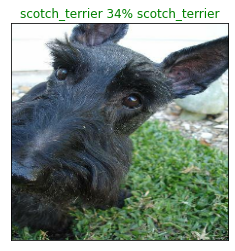

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

##Saving and Reloading The Trained Model

In [ ]:
# Create the function to save the trained model

def save_model(model, suffix=None):
  """
  Saves the given model in models directory and appends the suffix (string).
  """

  # Create the models directory pathname with current time
  model_dir = os.path.join("/content/drive/MyDrive/Dog Vision/Models", 
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5" # Save the model with this extension
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
# Create the function to load the trained model

def load_model(model_path):
  """
  Loads the trained model saved at model_path
  """

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Save and reload the trained images using the functions above.

In [ ]:
# Save model that is trained on 1000 images
save_model(model, suffix="1000-imagenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20230218-05111676697119-1000-imagenetv2-Adam.h5


'/content/drive/MyDrive/Dog Vision/Models/20230218-05111676697119-1000-imagenetv2-Adam.h5'

In [ ]:
# Now load the model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/Models/20230214-15401676389220-1000-imagenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20230214-15401676389220-1000-imagenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 86ms/step - loss: 1.3266 - accuracy: 0.6650


[1.3266403675079346, 0.6650000214576721]

In [ ]:
# Evaluate the now loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2935 - accuracy: 0.6650


[1.29351806640625, 0.6650000214576721]

## **Training the model based on full data**

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create batches of full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model = create_model()

Building Model With:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# Create full model early stopping callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Fit the entire data to full model.

In [ ]:
full_model.fit(full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 108ms/step - loss: 1.3453 - accuracy: 0.6707
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.4025 - accuracy: 0.8793
Epoch 3/100
320/320 [==============================] - 35s 108ms/step - loss: 0.2340 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1532 - accuracy: 0.9645
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1064 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0776 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0565 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 33s 101ms/step - loss: 0.0463 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0399 - accuracy: 0.9947
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog Vision/Models/20230218-05261676697991-full-image-set-mobilenetv2-Adam.h5


'/content/drive/MyDrive/Dog Vision/Models/20230218-05261676697991-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/Models/20230216-17261676568416-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/Models/20230216-17261676568416-full-image-set-mobilenetv2-Adam.h5


### Making Predictions on Test Dataset

Since the model is trained on the data, that is in the form of Tensor Bathes, to make predictions on test dataset, we will have to convert it into the same format.

We will use `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the predict() method called on our model.


In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:3]

['/content/drive/MyDrive/Dog Vision/test/ccaaacb28d0f5d18cbd02145743497b5.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ccab3c0f19163d8ba23c3fd0ae5661d2.jpg',
 '/content/drive/MyDrive/Dog Vision/test/cc94fa9675fddf20d84f34bf4a746b3b.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 143s 429ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")


In [ ]:
# Load the test predictions
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:5]

array([[2.57220412e-10, 5.58274835e-13, 1.76587356e-10, 2.09215978e-11,
        2.10781392e-10, 3.98363724e-16, 1.44408365e-11, 5.85842555e-11,
        6.94651747e-13, 1.14347885e-10, 4.22515842e-11, 1.07286283e-12,
        1.17403018e-10, 2.92797958e-13, 1.27286896e-11, 1.06650081e-13,
        3.22134463e-12, 8.45121889e-12, 3.05843878e-14, 2.34545223e-06,
        9.79683240e-13, 1.29256321e-08, 2.27474720e-10, 2.87374156e-13,
        1.27858768e-14, 1.10238402e-10, 1.19976876e-10, 2.45475385e-12,
        1.39988742e-13, 2.34685942e-08, 5.31354405e-11, 1.80621100e-12,
        2.63105343e-10, 1.04577555e-12, 2.11317769e-12, 2.67139616e-10,
        3.48654027e-12, 1.07917904e-10, 7.00645054e-13, 2.58362234e-13,
        2.71195722e-11, 4.82493175e-15, 9.60390079e-13, 7.58750701e-13,
        1.02719232e-13, 9.99997497e-01, 1.09034691e-11, 1.43919266e-14,
        1.19195322e-12, 1.47732697e-13, 1.78641130e-12, 2.30513629e-11,
        3.12951840e-13, 1.19809389e-08, 6.95358658e-12, 1.310894

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test data perdictions for kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas dataframe with only column names and no entries.
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ccaaacb28d0f5d18cbd02145743497b5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ccab3c0f19163d8ba23c3fd0ae5661d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cc94fa9675fddf20d84f34bf4a746b3b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ccb7c5f4d740f7bf8fb0161efe594b48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ccbb9dd96ed2b8a635b4389eb85c6c96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ccaaacb28d0f5d18cbd02145743497b5,2.572204e-10,5.582748e-13,1.765874e-10,2.092160e-11,2.107814e-10,3.983637e-16,1.444084e-11,5.858426e-11,6.946517e-13,...,1.537505e-09,1.777978e-08,2.017483e-11,1.638352e-13,5.368053e-11,1.612782e-13,2.354929e-09,1.108928e-10,7.453471e-11,1.390392e-11
1,ccab3c0f19163d8ba23c3fd0ae5661d2,1.333843e-12,2.767530e-12,6.372370e-13,7.097197e-14,1.921800e-09,2.332617e-14,4.925367e-14,1.408174e-13,1.000305e-08,...,1.391921e-10,3.080589e-13,1.105451e-09,9.653145e-12,2.112344e-12,5.565195e-14,5.756655e-11,8.887119e-14,2.353781e-12,1.230511e-11
2,cc94fa9675fddf20d84f34bf4a746b3b,5.822480e-10,3.187103e-11,7.764599e-12,1.181457e-09,6.699622e-06,6.324053e-10,1.788074e-09,2.078597e-06,4.589304e-08,...,3.415580e-07,8.479633e-09,1.470275e-08,4.221024e-06,1.453926e-10,5.753736e-10,5.321333e-11,3.665928e-07,2.493948e-08,1.624106e-08
3,ccb7c5f4d740f7bf8fb0161efe594b48,8.886275e-08,3.368457e-09,7.651631e-11,2.683266e-11,1.191117e-04,2.965444e-05,4.767107e-08,6.501963e-10,7.336212e-13,...,2.430854e-09,1.576138e-08,2.489779e-08,2.659759e-05,5.721117e-08,3.655967e-08,1.166824e-07,1.202114e-07,2.805078e-07,2.317509e-08
4,ccbb9dd96ed2b8a635b4389eb85c6c96,1.173091e-11,5.912133e-12,4.724783e-10,2.629230e-07,8.649589e-07,1.063498e-09,9.379182e-10,2.192534e-11,1.906986e-08,...,3.296251e-12,4.271848e-11,3.393367e-04,4.683843e-07,3.724725e-07,3.155465e-09,4.458786e-10,1.028974e-09,1.096821e-10,1.555011e-09


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

### Make Predictions on Custom Images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Create custom image filepaths
import os
custom_path = "/content/drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/Dog Vision/my-dog-photos/pauline-loroy-XH8A0bvQ7iE-unsplash.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/mika-baumeister-VLP_xXPddYk-unsplash.jpg',
 '/content/drive/MyDrive/Dog Vision/my-dog-photos/michael-dziedzic-si06cFB0g1s-unsplash.jpg']

In [ ]:
# Turn custom images into data batches
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on this custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
custom_preds

array([[6.26675867e-09, 5.89428788e-13, 3.51996557e-11, 6.62124522e-11,
        8.14977952e-09, 1.63755072e-08, 7.06995573e-11, 4.85068097e-10,
        4.65803665e-13, 1.22658854e-11, 1.85267361e-12, 3.12030807e-07,
        2.63751548e-10, 4.41228963e-11, 6.28507283e-13, 5.30620270e-11,
        9.99812782e-01, 2.98979591e-11, 2.05103393e-10, 1.35926726e-07,
        1.69430012e-10, 2.35803651e-12, 1.82785449e-12, 2.74605960e-09,
        1.67278025e-09, 3.55179941e-10, 8.70366140e-11, 3.88836092e-08,
        4.50210268e-12, 2.29358171e-10, 1.09019913e-08, 4.00959932e-10,
        3.62056635e-11, 1.76167596e-04, 1.42430946e-11, 2.15990041e-13,
        5.99642425e-09, 1.76113395e-11, 2.64243770e-12, 4.92862305e-12,
        1.89404847e-09, 4.27530296e-07, 1.37297854e-10, 2.14352980e-09,
        4.79360658e-08, 4.58519542e-11, 6.70035860e-10, 8.83529101e-12,
        1.99347386e-10, 1.07839793e-09, 1.53497326e-10, 6.70163591e-10,
        1.59146385e-08, 4.75010111e-08, 4.11331143e-07, 3.373538

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['border_collie', 'pug', 'malinois']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

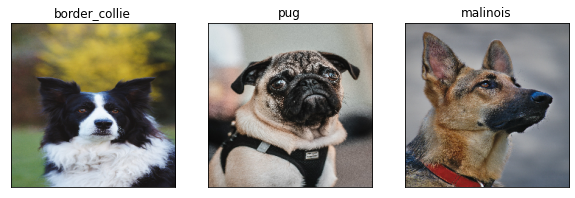

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)